## Neighborhood Venues Analysis for Café & Bar Crawls
IBM Data Science Capstone Project

#### Anthony Canterbury
September 29th, 2019

#### Packages:
*Note: You should update all of the base packages in this list to ensure proper running.*

In [1]:
# standard data
import numpy as np
import pandas as pd # > v24
import random
import json
import requests

# ploting
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns
import matplotlib.pyplot as plt

# machine learning
from sklearn.cluster import DBSCAN
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import jaccard_similarity_score # deprecated in newer versions
from sklearn.metrics import f1_score

# mapping
from geopy.geocoders import Nominatim # most likely need to install
import folium

#### Parameters:

In [2]:
# boundaries
MAX_PRICE = 3 # Foursquare tier (1-4) for expensive
MAX_WALK = 0.8 # ~ 0.5 miles in km

# keys for filtering categories of venues
VENUE_PRIME = ['bar', 'pub', 'brewery', 'lounge']
VENUE_SECONDARY = ['caf', 'coffee', 'tea', 'desert', 'ice cream', 'donut']
VENUE_KEYS = VENUE_PRIME + VENUE_SECONDARY
FS_SECTIONS = ['drinks', 'coffee'] # these were singled out after several api checks
MIN_PRIMES = 2
MIN_SECONDARY = 2
MIN_VENUES = 5
MAX_VENUES = 7

# Times
WEEK_DAY = 6 # Saturday
START_TIME = 1500 # 3 PM
END_TIME = 2200 # 10 PM

# crawl priorities
PRIORITY_ORDER = {'Rating': 4, 'Count': 2, 'Likes': 1} # adding weight of 2x to venue count, 4x to rating

## 1 Preliminary Data

### Get and parse the data for Cincinnati neighborhoods

In [3]:
# neighborhood geo data
nUrl = 'https://opendata.arcgis.com/datasets/572561553c9e4d618d2d7939c5261d46_0.geojson'
nJson = requests.get(nUrl).json()

# neighborhood buissness district geo data
bUrl = 'https://opendata.arcgis.com/datasets/0fa9e54fc1dd465886c3a5d980a97955_11.geojson'
bJson = requests.get(bUrl).json()

In [4]:
# get the center coordinate from matrix
def centeroidCord(arr, multi):
    x1 = arr[0][0]
    x2 = arr[0][0]
    y1 = arr[0][1]
    y2 = arr[0][1]
    if multi:
        for cord1 in arr:
            x1 = cord1[0][0]
            x2 = cord1[0][0]
            y1 = cord1[0][1]
            y2 = cord1[0][1]
            for cord in cord1:
                x1 = min(x1, cord[0])
                x2 = max(x2, cord[0])
                y1 = min(y1, cord[1])
                y2 = max(y2, cord[1])
    else:
        for cord in arr:
            x1 = min(x1, cord[0])
            x2 = max(x2, cord[0])
            y1 = min(y1, cord[1])
            y2 = max(y2, cord[1])
    return y1 + ((y2 - y1) / 2), x1 + ((x2 - x1) / 2)

# build the neighborhood dataframe from neighborhood json (nJson) and get the approximate center coordinates
neighborhoods = []
for feature in nJson['features']:
    Lat, Long = centeroidCord(feature['geometry']['coordinates'][0], feature['geometry']['type'] != 'Polygon')
    neighborhoods.append((feature['properties']['SNA_NAME'], 0, Lat, Long, feature['properties']['ACRES']))

cincyNeighsAcres = pd.DataFrame(neighborhoods)
cincyNeighsAcres.columns = ['Neighborhood', 'BusinessDistrict', 'Latitude', 'Longitude', 'Acres']

# Only will use acres for pretty pictures
cincyNeighs = cincyNeighsAcres.drop(columns=['Acres'])

# CUF to Clifton Heights
cincyNeighs.loc[cincyNeighs.Neighborhood == 'CUF', ['Neighborhood']] = 'Clifton Heights'

# North Avondale
cincyNeighs.loc[cincyNeighs.Neighborhood == 'North Avondale - Paddock Hills', ['Neighborhood']] = 'North Avondale'

# if business district is available use it's center coordinates and create multiples
for feature in bJson['features']:
    Lat, Long = centeroidCord(feature['geometry']['coordinates'][0], feature['geometry']['type'] != 'Polygon')
    # parse for multiple neighborhood name
    districtNum = 1
    districtName = feature['properties']['NBDNAME']
    if 'OTR Vine' in districtName:
        districtName = 'Over-the-Rhine'
    if 'OTR' in districtName:
        districtName = 'Over-the-Rhine'
        districtNum = 2
    if '(A)' in districtName:
        districtName = districtName.replace(' (A)', '')
    if '(B)' in districtName:
        districtName = districtName.replace(' (B)', '')
        districtNum = 2
    if 'Hyde Park East' in districtName:
        districtName = 'Hyde Park'
    
    if districtNum == 1:
        cincyNeighs.loc[cincyNeighs.Neighborhood == districtName, ['BusinessDistrict', 'Latitude', 'Longitude']] = districtNum, Lat, Long
    else:
        cincyNeighs = cincyNeighs.append({'Neighborhood': districtName, 'BusinessDistrict': districtNum, 'Latitude': Lat, 'Longitude': Long }, ignore_index=True)

cincyNeighs.sort_values(by=['Neighborhood']).reset_index(drop=True)

,Neighborhood,BusinessDistrict,Latitude,Longitude
0,Avondale,1,39.144072,-84.499246
1,Avondale,2,39.145541,-84.491047
2,Bond Hill,1,39.176159,-84.466794
3,California,0,39.068846,-84.418962
4,Camp Washington,1,39.136790,-84.537583
5,Carthage,1,39.195554,-84.478737
6,Clifton,1,39.143023,-84.520058
7,Clifton Heights,1,39.128135,-84.517137
8,College Hill,1,39.200302,-84.546862
9,Columbia Tusculum,1,39.114023,-84.436198


### Cincinnati Neighborhood Map

In [5]:
# get the center of Cincinnati
geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode('Cincinnati')
latitude = location.latitude + 0.03 # adjustment for better centering
longitude = location.longitude
print('Coordinate of Cincinnati are {}, {}.'.format(latitude, longitude))

Coordinate of Cincinnati are 39.1314537, -84.5124602.


We're going to make a lot of maps so lets make a function. Markers will be unique so we'll leave them off

In [6]:
def makeMap(center = [latitude, longitude], zoom = 12):
    neighMap = folium.Map(location=center, zoom_start=zoom)

    # choropleth map without data to outline the neighborhoods    
    folium.Choropleth(
        geo_data=nJson,
        data=cincyNeighsAcres,
        columns=['Neighborhood','Acres'],
        key_on='feature.properties.SNA_NAME',
        fill_color='YlOrRd', 
        fill_opacity=0.3, 
        line_opacity=0.5,
        legend_name='Cincinnati Neighborhood Acres'
    ).add_to(neighMap)
    
    return neighMap

In [7]:
cincyNeighMap = makeMap()

# add approximate buisness center markers to map
for lat, lng, neighborhood in zip(cincyNeighs['Latitude'], cincyNeighs['Longitude'], cincyNeighs['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7
    ).add_to(cincyNeighMap)
    
# display map
cincyNeighMap

From visible inspection it's pretty good centering of neighborhood business districts.

The only outlier due to it's odd shape and lack of business districts is Riverside. We'll go ahead and remove it from the list and update the map.

*Note: Not all business districts are represented but this will help with collecting the data.*

In [8]:
cincyNeighs = cincyNeighs[cincyNeighs.Neighborhood != 'Riverside'].reset_index(drop=True)

# again render the map, not a super easy way to remove or update markers
cincyNeighMap = makeMap()

# add approximate buisness center markers to map
for lat, lng, neighborhood in zip(cincyNeighs['Latitude'], cincyNeighs['Longitude'], cincyNeighs['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(cincyNeighMap)
    
# display map
cincyNeighMap

### Get and parse the venue data from Foursquare

In [9]:
# Foursquare Credentials and Version, hidden before upload (add your own to try)
CLIENT_ID = 'I2PLWQXBKCLEOSVZGTVZCC3ZLHN5WKNBEZMD3K3CFB0A2UQE'
CLIENT_SECRET = 'Y3NZYU43OZTJQKK4NQLRODJKHY35PV2OAGL0QMGMHV1SXNDX'
VERSION = '20190928'

#### Grab max of 100 venues from a 1000 meter radius
*Note: These have been examined in detail through many iteration before these parameters were selected as optimal.*

In [10]:
# load the data from csv in order to not make too many calls
venuesDf = pd.read_csv('cincyVenues.csv')
venuesDf.drop(columns=['Unnamed: 0'], inplace = True)

In [11]:
print(venuesDf.shape)
venuesDf.head(20)

(685, 9)


,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory
0,Linwood,0,39.104213,-84.415924,Dennert H Distribtg,4f32494419836c91c7c8b7f7,39.108777,-84.421232,Wine Bar
1,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar
2,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar
3,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar
4,East Walnut Hills,1,39.128889,-84.476823,BrewRiver Gastropub,4fea02ede5e8dfeeb65b5000,39.121758,-84.475027,Gastropub
5,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge
6,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar
7,Queensgate,0,39.108472,-84.533758,City West Brewing Company,580ceb4a38faa26bf32db135,39.108208,-84.525736,Brewery
8,Queensgate,0,39.108472,-84.533758,The Playhouse,4e9a404977c807974bd69725,39.106017,-84.541503,Bar
9,Queensgate,0,39.108472,-84.533758,Royal Imports,4f3246f419836c91c7c7cd1e,39.102755,-84.526398,Wine Bar


#### Cleanup the venues
- Remove duplicates
- Remove categories that slipped through

In [12]:
# there should be quite a few duplicates
cincyVenues = venuesDf.drop_duplicates(subset=['VenueId'])
print(cincyVenues.shape)

# unique categories
cincyVenues['VenueCategory'].unique().tolist()

(395, 9)


['Wine Bar',
 'Beer Bar',
 'Cocktail Bar',
 'Bar',
 'Gastropub',
 'Lounge',
 'Brewery',
 'Whisky Bar',
 'Dive Bar',
 'Pub',
 'Sports Bar',
 'Karaoke Bar',
 'Gay Bar',
 'Ice Cream Shop',
 'Coffee Shop',
 'Hookah Bar',
 'Hotel Bar',
 'Steakhouse',
 'Café',
 'Donut Shop',
 'Tea Room',
 'Bubble Tea Shop',
 'College Cafeteria']

Most of these will fit but we don't see people wanting to gather at cafeterias or barbershops (well maybe some much older people).

In [13]:
# remove cafeterias
cincyVenues = cincyVenues[cincyVenues.VenueCategory != 'Cafeteria']
cincyVenues = cincyVenues[cincyVenues.VenueCategory != 'College Cafeteria']

# remove restaurants
cincyVenues = cincyVenues[cincyVenues.VenueCategory != 'Steakhouse']
cincyVenues = cincyVenues[cincyVenues.VenueCategory != 'Gastropub'].reset_index(drop=True)

print(cincyVenues.shape)
cincyVenues['VenueCategory'].unique().tolist()

(381, 9)


['Wine Bar',
 'Beer Bar',
 'Cocktail Bar',
 'Bar',
 'Lounge',
 'Brewery',
 'Whisky Bar',
 'Dive Bar',
 'Pub',
 'Sports Bar',
 'Karaoke Bar',
 'Gay Bar',
 'Ice Cream Shop',
 'Coffee Shop',
 'Hookah Bar',
 'Hotel Bar',
 'Café',
 'Donut Shop',
 'Tea Room',
 'Bubble Tea Shop']

### Map the venues

In [14]:
venueMap = makeMap()

# add approximate buisness center markers to map
for lat, lng, venue in zip(cincyVenues['VenueLatitude'], cincyVenues['VenueLongitude'], cincyVenues['VenueName']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(venueMap)
    
# display map
venueMap

### Clustering our venues by location

In order to group and restrict venues down to valid clusters we'll be using DBSCAN (Density-Based Spatial Clustering of Applications with Noise).

In [15]:
# pull venue coordinates into a matrix
coords = cincyVenues[['VenueLatitude', 'VenueLongitude']].to_numpy()

kmsPerRadian = 6371.0088
epsilon = MAX_WALK / kmsPerRadian # in km radians

cvDb = DBSCAN(eps=epsilon, min_samples=MIN_VENUES, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
clusterLabels = cvDb.labels_
numClusters = len(set(clusterLabels))
clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
print('Number of clusters: {}'.format(numClusters))
set(clusterLabels)

Number of clusters: 16


{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}

In [16]:
# combine the cluster data with cincyVenues
cincyVenues['DbCluster'] = clusterLabels
cincyVenues.head(10)

,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,DbCluster
0,Linwood,0,39.104213,-84.415924,Dennert H Distribtg,4f32494419836c91c7c8b7f7,39.108777,-84.421232,Wine Bar,-1
1,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar,0
2,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar,0
3,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar,0
4,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge,0
5,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar,0
6,Queensgate,0,39.108472,-84.533758,City West Brewing Company,580ceb4a38faa26bf32db135,39.108208,-84.525736,Brewery,1
7,Queensgate,0,39.108472,-84.533758,The Playhouse,4e9a404977c807974bd69725,39.106017,-84.541503,Bar,-1
8,Queensgate,0,39.108472,-84.533758,Royal Imports,4f3246f419836c91c7c7cd1e,39.102755,-84.526398,Wine Bar,1
9,Mt. Washington,1,39.093074,-84.387447,London Bridge,4c3942f22c8020a1fe7e8c00,39.092869,-84.387158,Bar,-1


#### Visualize the clusters

In [17]:
clusterMap = makeMap()

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters)]

# add venues with cluster colors
for lat, lng, venue, clustN in zip(cincyVenues['VenueLatitude'], cincyVenues['VenueLongitude'], cincyVenues['VenueName'], cincyVenues['DbCluster']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    # red around blue for outliers otherwise random colors
    c=('blue' if clustN == -1 else colors[np.int(clustN)])
    fc=('red' if clustN == -1 else colors[np.int(clustN)])
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=fc,
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)
    
# display map
clusterMap

The red around the blue circles mark the outliers, venues more than a half mile away from any other venue. Outliers are of course bad spots for the event so we should remove them from our dataset.

In [18]:
# remove outliers
cincyVenues = cincyVenues[cincyVenues.DbCluster != -1].reset_index(drop=True)

print('We are now down to {}'.format(cincyVenues.shape[0])+' venues! And {}'.format(numClusters -1)+(' neighborhood sections to pick from.'))

We are now down to 325 venues! And 15 neighborhood sections to pick from.


#### And map again

In [19]:
clusterMap = makeMap()

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters - 1)]

# add venues with cluster colors
for lat, lng, venue, clustN in zip(cincyVenues['VenueLatitude'], cincyVenues['VenueLongitude'], cincyVenues['VenueName'], cincyVenues['DbCluster']):
    label = '{}'.format(clustN)+' {}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    c=colors[np.int(clustN)]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='grey',
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)

# legendHtml = '''<div style="position: fixed; bottom: 50px; left: 50px; width: 100px; height: 
#    90px; border:2px solid grey; z-index:9999; font-size:14px;">&nbsp; Cluster Legend <br>
#    &nbsp; Cluster &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i></div>'''
# clusterMap.get_root().html.add_child(folium.Element(legendHtml))

# display map
clusterMap

## 2 Recommendation System

### Pull in venue details from Foursquare
- Venue Hours to collect days and hours. Then filter.
- Venue Details to collect price and rating

In [20]:
# load the data from csv in order to not make too many calls
venueHours = pd.read_csv('venueHours.csv', dtype = {'Start': np.object, 'End': np.object})
venueHours.drop(columns=['Unnamed: 0'], inplace = True)

In [21]:
print(venueHours.shape)
venueHours.head()

(118, 4)


,VenueId,DayOf,Start,End
0,55461bf6498eac118325e62e,True,1200,+0000
1,4b0220f4f964a520eb4722e3,True,1700,+0230
2,53b74740498e8cb5722a80a2,True,1100,+0000
3,51fd186b498ecee282bedc11,True,1200,+0130
4,54e8dc93498e2565b4a9f267,True,1100,+0000


Not the greatest sampling of hours :( But we can use machine learning to fill in the blanks. To improve this we could in the future pull more hours from various datasets (e.g. Yelp Api).

#### Merge, format, and predict missing times
This works because it's reasonable to assume that similar venue categories in similar areas will have similar hours. Let's test this assumtion first though.

We will switch hours to our required range in order to normalize.

In [22]:
# loop through venues to build new df for modeling
vHourOpen = [] # df for later
vHourFeats = [] # df of categories and cluster
vHourLabels = [] # closed, partial (parially open), and open

for i, row in venueHours.iterrows():
    vId = row['VenueId']
    cVrow = cincyVenues.loc[cincyVenues['VenueId'] == vId]
    vCat = cVrow['VenueCategory'].values[0]
    catName = vCat.lower()
    vCat = [i for i, s in enumerate(VENUE_KEYS) if s in catName][0]
    vCluster = cVrow['DbCluster'].values[0]
    vHourFeats.append((vCat, vCluster))
    
    vOpen = 'closed'
    if row['DayOf']:
        # parse Hours
        vStart = int(row['Start'])
        vEnd = row['End']
        if '+' in vEnd:
            vEnd = int(vEnd.replace('+0', ''))+2400
        else:
            vEnd = int(vEnd)
        if START_TIME >= vStart and END_TIME <= vEnd:
            vOpen = 'open'
        # next is a test for partial time open but we are going to just call them open here
        elif START_TIME >= vStart or (START_TIME < vStart and END_TIME > vStart):
            vOpen = 'open'
    
    vHourOpen.append((vId, vOpen))
    vHourLabels.append(vOpen)

vHourOpen = pd.DataFrame(vHourOpen)
vHourOpen.columns = ['VenueId', 'VenueOpen']

vHourFeats = pd.DataFrame(vHourFeats)
vHourFeats.columns = ['VenueCategory', 'VenueCluster']

vHourFeats.head()

,VenueCategory,VenueCluster
0,0,0
1,0,2
2,0,2
3,2,2
4,2,1


In [23]:
X = vHourFeats
Y = vHourLabels

#### Time to model and test

Prep the test and train data

In [24]:
# this was sampled multiple times to find the best size
X_train, X_test, Y_train, Y_test = train_test_split( X, Y, test_size=0.5, random_state=4)
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_transformed = scaler.transform(X_train)

print ('Train set:', len(X_train),  len(Y_train))
print ('Test set:', len(X_test),  len(Y_test))
# we want to make sure there is a good sampling
u, count = np.unique(Y, return_counts=True)
print(u, count/len(Y))
uTest, countTest = np.unique(Y_test, return_counts=True)
print(uTest, countTest/len(Y_test))

Train set: 59 59
Test set: 59 59
['closed' 'open'] [0.07627119 0.92372881]
['closed' 'open'] [0.08474576 0.91525424]


#### k-nearest neighbors (KNN)
This model should be suffiecient for our needs.

In [25]:
Ks = 10
mean_acc = np.zeros((Ks-1))
for n in range(1,Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train_transformed,Y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(Y_test, yhat)

openKNN = KNeighborsClassifier(n_neighbors = mean_acc.argmax()+1).fit(X_train_transformed,Y_train)
yhat = openKNN.predict(X_test)
print( "The best KNN's accuracy was with accuracy of", mean_acc.max(), "with k=", mean_acc.argmax()+1) 
print("Jaccard Score: ", jaccard_similarity_score(Y_test, yhat))
print("F1 Score: ", f1_score(Y_test, yhat, average='weighted'))

The best KNN's accuracy was with accuracy of 0.9152542372881356 with k= 1
Jaccard Score:  0.9152542372881356
F1 Score:  0.8747562621868907


C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:635: DeprecationWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  'and multiclass classification tasks.', DeprecationWarning)
C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


#### Use the model to make prediction on the model and remove the closed venues

In [26]:
# create a predicted value df
venuesO = pd.merge(cincyVenues, vHourOpen, on=['VenueId'], how='outer')
oId = []
oNorm = []
for i, row in venuesO.iterrows():
    if pd.isna(row['VenueOpen']):
        oId.append(row['VenueId'])
        vCat = row['VenueCategory']
        catName = vCat.lower()
        vCat = [i for i, s in enumerate(VENUE_KEYS) if s in catName][0]
        vCluster = cVrow['DbCluster']
        oNorm.append((vCat, vCluster))

oX = preprocessing.StandardScaler().fit(oNorm).transform(oNorm)        
oYhat = openKNN.predict(oX)
newOpen = pd.DataFrame(np.stack((oId, oYhat), axis=-1))
newOpen.columns = ['VenueId', 'VenueOpen']
for i, row in newOpen.iterrows():
    venuesO.loc[venuesO['VenueId'] == row['VenueId'], 'VenueOpen'] = row['VenueOpen']
venuesO['VenueOpen'].unique().tolist()

['open', 'closed']

In [27]:
print(venuesO.shape)
venuesO = venuesO[venuesO.VenueOpen != 'closed']
print(venuesO.shape)

# then drop the column
cincyVenues2 = venuesO.drop(columns=['VenueOpen'])

(325, 11)
(316, 11)


#### Recluster the venues

In [28]:
# pull venue coordinates into a matrix
coords = cincyVenues2[['VenueLatitude', 'VenueLongitude']].to_numpy()

cvDb = DBSCAN(eps=epsilon, min_samples=MIN_VENUES, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
clusterLabels = cvDb.labels_
numClusters = len(set(clusterLabels))
clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
print('Number of clusters: {}'.format(numClusters))
set(clusterLabels)

# combine the cluster data with cincyVenues
cincyVenues2.drop(columns=['DbCluster'])
cincyVenues2['DbCluster'] = clusterLabels
cincyVenues2.head(10)

Number of clusters: 15


,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,DbCluster
0,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar,0
1,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar,0
2,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar,0
3,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge,0
4,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar,0
5,Queensgate,0,39.108472,-84.533758,City West Brewing Company,580ceb4a38faa26bf32db135,39.108208,-84.525736,Brewery,1
6,Queensgate,0,39.108472,-84.533758,Royal Imports,4f3246f419836c91c7c7cd1e,39.102755,-84.526398,Wine Bar,1
7,Northside,1,39.160795,-84.538946,Listing Loon,51e5e417498efc97bd300341,39.161013,-84.539239,Bar,2
8,Northside,1,39.160795,-84.538946,Northside Tavern,4b0220f4f964a520eb4722e3,39.162420,-84.539773,Bar,2
9,Northside,1,39.160795,-84.538946,The Littlefield,53b74740498e8cb5722a80a2,39.157769,-84.539931,Whisky Bar,2


In [29]:
# remove outliers
cincyVenues2 = cincyVenues2[cincyVenues2.DbCluster != -1].reset_index(drop=True)

print('We are now down to {}'.format(cincyVenues2.shape[0])+' venues! And {}'.format(numClusters -1)+(' neighborhood sections to pick from.'))

We are now down to 316 venues! And 14 neighborhood sections to pick from.


In [30]:
clusterMap = makeMap()

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters)]

# add venues with cluster colors
for lat, lng, venue, clustN in zip(cincyVenues2['VenueLatitude'], cincyVenues2['VenueLongitude'], cincyVenues2['VenueName'], cincyVenues2['DbCluster']):
    label = '{}'.format(clustN)+' {}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    c=colors[np.int(clustN)]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='grey',
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)
    
# display map
clusterMap

#### Pull details for open venues

In [31]:
# load the data from csv in order to not make too many calls
venueDetails = pd.read_csv('venueDetails.csv')
venueDetails.drop(columns=['Unnamed: 0'], inplace = True)

In [32]:
print(venueDetails.shape)
venueDetails.head(10)

(316, 4)


,DbCluster,Rating,Likes,Price
0,0,8.4,33,NaN
1,0,8.3,38,3.0
2,0,7.5,25,2.0
3,0,NaN,1,3.0
4,0,NaN,0,2.0
5,1,NaN,1,2.0
6,1,NaN,0,2.0
7,2,8.3,20,2.0
8,2,8.2,82,2.0
9,2,8.7,38,3.0


There is a peculiarity to some of the price ranking data. Many venues that have no rating or likes have prices. For now we'll trust the data.

### Predict missing data

Predicting ratings is pretty pointless with the data we have but we should predict price just in case.

In [33]:
# loop through venues to build new df for modeling
vPrice = [] # df for later
vPriceFeats = [] # df of categories and cluster
vPriceComplete = [] # for plotting
vPriceLabels = [] # closed, partial (parially open), and open

#cincyVenues2
for i, row in venueDetails.iterrows():
    vId = cincyVenues2.loc[i, 'VenueId']
    vPriceComplete.append((vId, row['Rating'], row['Likes'], row['Price']))
    if pd.isna(row['Price']):
        continue
    vCatName = cincyVenues2.loc[i, 'VenueCategory']
    catName = vCatName.lower()
    vCat = [i for i, s in enumerate(VENUE_KEYS) if s in catName][0]
    vPriceFeats.append((int(row['DbCluster']), vCat,  float(row['Rating']), int(row['Likes'])))
    vPrice.append((vId, int(row['Price'])))
    vPriceLabels.append(int(row['Price']))

vPrice = pd.DataFrame(vPrice)
vPrice.columns = ['VenueId', 'VenuePrice']

vPriceFeats = pd.DataFrame(vPriceFeats)
vPriceFeats.columns = ['DbCluster', 'VenueCategory', 'VenueRating', 'VenueLikes']

vPriceComplete = pd.DataFrame(vPriceComplete)
vPriceComplete.columns = ['VenueId', 'VenueRating', 'VenueLikes', 'VenuePrice']

print(vPriceFeats.shape)
vPriceFeats.head()

(309, 4)


,DbCluster,VenueCategory,VenueRating,VenueLikes
0,0,0,8.3,38
1,0,0,7.5,25
2,0,3,NaN,1
3,0,0,NaN,0
4,1,2,NaN,1


#### Correlation

In [34]:
vPriceCorr = vPriceFeats
vPriceCorr['VenuePrice'] = vPriceLabels
vPriceCorr.corr()

,DbCluster,VenueCategory,VenueRating,VenueLikes,VenuePrice
DbCluster,1.000000,-0.006894,-0.174062,-0.133704,-0.068473
VenueCategory,-0.006894,1.000000,0.050535,-0.010160,-0.532074
VenueRating,-0.174062,0.050535,1.000000,0.498003,0.063367
VenueLikes,-0.133704,-0.010160,0.498003,1.000000,0.007484
VenuePrice,-0.068473,-0.532074,0.063367,0.007484,1.000000


There is a medium correlation between category and price but not much else. would have expected more correlation between cluster and price. Guess prices don't vary so much in the city.
Lets look at some plots.

#### Compare effect of categories through plotting.

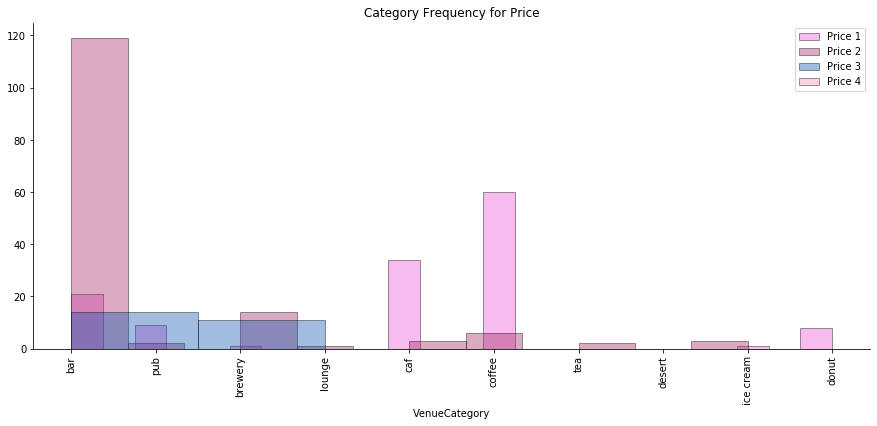

In [35]:
plt.figure(figsize=(15,6))
plt.title("Category Frequency for Price")
priceIndex = [1,2,3,4]
colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in priceIndex]

for i in priceIndex:
    sns.distplot(vPriceCorr[vPriceCorr.VenuePrice == i].VenueCategory, color=colors[i-1], kde=False, label='Price {}'.format(i),
                hist_kws={'edgecolor':'black'})

plt.xticks(range(len(VENUE_KEYS)), VENUE_KEYS,rotation='vertical', fontsize=10)
plt.legend()
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

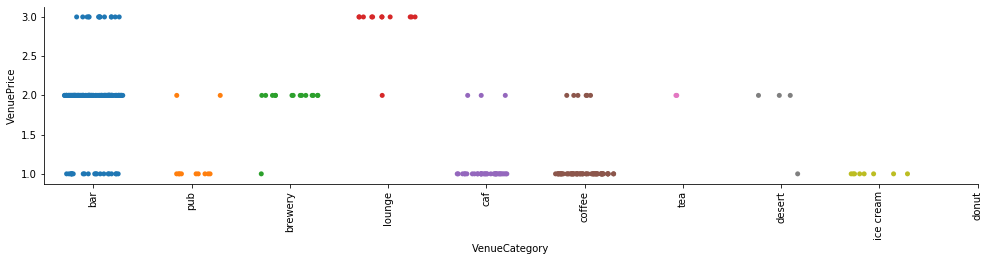

In [36]:
catP = sns.catplot(x='VenueCategory', y='VenuePrice', 
            data=vPriceCorr,
            jitter='0.3',
            height=4, aspect=1.5)

catP.fig.set_size_inches(15,3)
plt.xticks(range(len(VENUE_KEYS)), VENUE_KEYS,rotation='vertical', fontsize=10)
plt.show()

#### KNN Model

In [37]:
Xp = vPriceFeats.drop(columns=['VenueRating', 'VenueLikes', 'VenuePrice']) # the rest will just be noise
Yp = vPriceLabels

Xp_train, Xp_test, Yp_train, Yp_test = train_test_split( Xp, Yp, test_size=0.35, random_state=0)
scaler = preprocessing.StandardScaler().fit(Xp_train)
Xp_train_transformed = scaler.transform(Xp_train)
print ('Train set:', len(Xp_train),  len(Yp_train))
print ('Test set:', len(Xp_test),  len(Yp_test))
# we want to make sure there is a good sampling
u, count = np.unique(Yp, return_counts=True)
print(u, count/len(Y))
uTest, countTest = np.unique(Yp_test, return_counts=True)
print(uTest, countTest/len(Yp_test))

Train set: 200 200
Test set: 109 109
[1 2 3] [1.13559322 1.27118644 0.21186441]
[1 2 3] [0.44954128 0.47706422 0.0733945 ]


In [38]:
Ks = 10
mean_acc = np.zeros((Ks-1))
for n in range(1,Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(Xp_train_transformed,Yp_train)
    yhat=neigh.predict(Xp_test)
    mean_acc[n-1] = metrics.accuracy_score(Yp_test, yhat)

priceKNN = KNeighborsClassifier(n_neighbors = mean_acc.argmax()+1).fit(Xp_train_transformed,Yp_train)
yhat = priceKNN.predict(Xp_test)
print( "The best KNN's accuracy was with accuracy of", mean_acc.max(), "with k=", mean_acc.argmax()+1) 
print("Jaccard Score: ", jaccard_similarity_score(Yp_test, yhat))
print("F1 Score: ", f1_score(Yp_test, yhat, average='weighted'))

The best KNN's accuracy was with accuracy of 0.8440366972477065 with k= 1
Jaccard Score:  0.8440366972477065
F1 Score:  0.8118461875646364


C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:635: DeprecationWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  'and multiclass classification tasks.', DeprecationWarning)
C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


For comparison lets try a Logistic Regression algorithm.

In [39]:
priceLR = LogisticRegression(solver='liblinear').fit(Xp_train_transformed,Yp_train)
yhatLR = priceLR.predict(Xp_test)
metrics.accuracy_score(Yp_test, yhatLR)
print("Jaccard Score: ", jaccard_similarity_score(Yp_test, yhatLR))
print("F1 Score: ", f1_score(Yp_test, yhatLR, average='weighted'))

Jaccard Score:  0.8348623853211009
F1 Score:  0.8030621014970718


C:\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:635: DeprecationWarning: jaccard_similarity_score has been deprecated and replaced with jaccard_score. It will be removed in version 0.23. This implementation has surprising behavior for binary and multiclass classification tasks.
  'and multiclass classification tasks.', DeprecationWarning)
C:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


#### Predict missing price

In [40]:
venuesP = pd.merge(cincyVenues2, vPriceComplete, on=['VenueId'], how='outer')
print(venuesP.shape)
venuesP.head()

(316, 13)


,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,DbCluster,VenueRating,VenueLikes,VenuePrice
0,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar,0,8.4,33.0,NaN
1,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar,0,8.3,38.0,3.0
2,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar,0,7.5,25.0,2.0
3,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge,0,NaN,1.0,3.0
4,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar,0,NaN,0.0,2.0


In [41]:
# create a predicted value df
venuesP = pd.merge(cincyVenues2, vPriceComplete, on=['VenueId'], how='outer')
pId = []
pNorm = []
for i, row in venuesP.iterrows():
    if pd.isna(row['VenuePrice']):
        pId.append(row['VenueId'])
        vCat = row['VenueCategory']
        catName = vCat.lower()
        vCat = [i for i, s in enumerate(VENUE_KEYS) if s in catName][0]
        vCluster = cVrow['DbCluster']
        pNorm.append((vCat, vCluster))

pX = preprocessing.StandardScaler().fit(pNorm).transform(pNorm)      
pYhat = priceKNN.predict(pX)
newPrice = pd.DataFrame(np.stack((pId, pYhat), axis=-1))
newPrice.columns = ['VenueId', 'VenuePrice']
newPrice['VenuePrice'] = newPrice['VenuePrice'].astype('int32')
print(venuesP['VenuePrice'].unique().tolist())
print(newPrice['VenuePrice'].unique().tolist())
for i, row in newPrice.iterrows():
    venuesP.loc[venuesP['VenueId'] == row['VenueId'], 'VenuePrice'] = row['VenuePrice']
venuesP['VenuePrice'].unique().tolist()

[nan, 3.0, 2.0, 1.0]
[2]


[2.0, 3.0, 1.0]

In [42]:
print(venuesP.shape)
venuesP = venuesP[venuesP.VenuePrice <= MAX_PRICE]
print(venuesP.shape)

# then drop the column
cincyVenues3 = venuesP
cincyVenues3.head()

(316, 13)
(316, 13)


,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,DbCluster,VenueRating,VenueLikes,VenuePrice
0,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar,0,8.4,33.0,2.0
1,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar,0,8.3,38.0,3.0
2,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar,0,7.5,25.0,2.0
3,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge,0,NaN,1.0,3.0
4,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar,0,NaN,0.0,2.0


No changes.

### Clean and Cluster new data
#### Cleanup clusters based on our criteria (minimum values for primary and secondary venues)

In [43]:
cincyCrawlVenues = cincyVenues3
dBs = cincyCrawlVenues['DbCluster'].unique().tolist()
keyArray = []
for i in dBs:
    keyArray.append([0, 0])
    dBrows = cincyCrawlVenues.loc[cincyCrawlVenues['DbCluster'] == i]
    for j, row in dBrows.iterrows():
        vCatName = row['VenueCategory']
        catName = vCatName.lower()
        if [k for k, s in enumerate(VENUE_PRIME) if s in catName]:
            keyArray[i][0] += 1
        else:
            keyArray[i][1] += 1

print(keyArray)
for i in dBs:
    if keyArray[i][0] < MIN_PRIMES or keyArray[i][1] < MIN_SECONDARY:
        cincyCrawlVenues = cincyCrawlVenues[cincyCrawlVenues.DbCluster != i].reset_index(drop=True)

dBs = cincyCrawlVenues['DbCluster'].unique().tolist()
print('We are now down to {}'.format(cincyCrawlVenues.shape[0])+' venues! And {}'.format(len(dBs))+(' neighborhood sections to pick from.'))

[[5, 5], [83, 42], [15, 3], [7, 4], [6, 0], [19, 24], [6, 1], [17, 19], [6, 6], [4, 1], [2, 5], [6, 3], [4, 1], [15, 2], [3, 2]]
We are now down to 293 venues! And 11 neighborhood sections to pick from.


In [44]:
# recluster
# pull venue coordinates into a matrix
coords = cincyCrawlVenues[['VenueLatitude', 'VenueLongitude']].to_numpy()

cvDb = DBSCAN(eps=epsilon, min_samples=MIN_VENUES, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
clusterLabels = cvDb.labels_
numClusters = len(set(clusterLabels))
clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
print('Number of clusters: {}'.format(numClusters))
set(clusterLabels)

# combine the cluster data with cincyVenues
cincyCrawlVenues.drop(columns=['DbCluster'])
cincyCrawlVenues['DbCluster'] = clusterLabels
cincyCrawlVenues.head(10)

Number of clusters: 11


,Neighborhood,BusinessDistrict,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,DbCluster,VenueRating,VenueLikes,VenuePrice
0,East Walnut Hills,1,39.128889,-84.476823,The Woodburn Brewery & Taproom,55461bf6498eac118325e62e,39.129030,-84.476892,Beer Bar,0,8.4,33.0,2.0
1,East Walnut Hills,1,39.128889,-84.476823,Myrtle's Punch House,5473d783498ec0bbca9021d6,39.124276,-84.476130,Cocktail Bar,0,8.3,38.0,3.0
2,East Walnut Hills,1,39.128889,-84.476823,The Growler House,545d54ab498ea427d9af9d2d,39.129763,-84.477778,Bar,0,7.5,25.0,2.0
3,East Walnut Hills,1,39.128889,-84.476823,The Skunk Lounge,5182cdbd498e1c1b38b47f1c,39.124213,-84.476246,Lounge,0,NaN,1.0,3.0
4,East Walnut Hills,1,39.128889,-84.476823,Cliche,5d6459abca17630008abf539,39.123820,-84.477040,Bar,0,NaN,0.0,2.0
5,Queensgate,0,39.108472,-84.533758,City West Brewing Company,580ceb4a38faa26bf32db135,39.108208,-84.525736,Brewery,1,NaN,1.0,2.0
6,Queensgate,0,39.108472,-84.533758,Royal Imports,4f3246f419836c91c7c7cd1e,39.102755,-84.526398,Wine Bar,1,NaN,0.0,2.0
7,Northside,1,39.160795,-84.538946,Listing Loon,51e5e417498efc97bd300341,39.161013,-84.539239,Bar,2,8.3,20.0,2.0
8,Northside,1,39.160795,-84.538946,Northside Tavern,4b0220f4f964a520eb4722e3,39.162420,-84.539773,Bar,2,8.2,82.0,2.0
9,Northside,1,39.160795,-84.538946,The Littlefield,53b74740498e8cb5722a80a2,39.157769,-84.539931,Whisky Bar,2,8.7,38.0,3.0


In [45]:
clusterMap = makeMap()

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(numClusters)]

# add venues with cluster colors
for lat, lng, venue, clustN in zip(cincyCrawlVenues['VenueLatitude'], cincyCrawlVenues['VenueLongitude'], cincyCrawlVenues['VenueName'], cincyCrawlVenues['DbCluster']):
    label = '{}'.format(clustN)+' {}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    c=colors[np.int(clustN)]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='grey',
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)
    
# display map
clusterMap

### Analyze the clusters

As was expected and you can see from the latest map the downtown and adjacent neighborhoods have the most qualifying venues for the crawl. But now it's time to test quality over quantity.

#### Neighborhood Cluster Count

In [46]:
# neighborhoods within the cluster
vClusters = cincyCrawlVenues.groupby('DbCluster')

clusterNeighs = vClusters.apply(lambda x: x['Neighborhood'].unique()).reset_index()
clusterNeighs.columns = ['DbCluster', 'Neighborhoods']
pd.set_option('max_colwidth', 100)
clusterNeighs

,DbCluster,Neighborhoods
0,0,[East Walnut Hills]
1,1,"[Queensgate, West End, Mt. Auburn, Downtown, Over-the-Rhine, Pendleton]"
2,2,[Northside]
3,3,[Roselawn]
4,4,"[Mt. Auburn, Avondale, Clifton, Clifton Heights, Corryville, Walnut Hills]"
5,5,"[Hyde Park, Oakley]"
6,6,"[Evanston, North Avondale]"
7,7,"[Pleasant Ridge, Kennedy Heights]"
8,8,"[East End, Columbia Tusculum, Mt. Lookout]"
9,9,[Westwood]


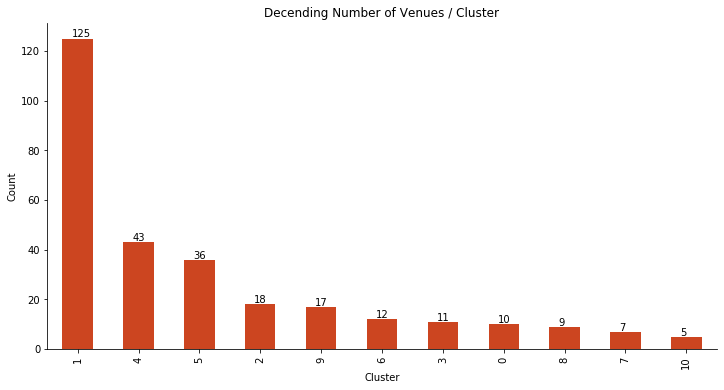

In [47]:
# get count for each cluster
clusterCounts = cincyCrawlVenues['DbCluster'].value_counts()
plt.figure(figsize=(12,6))
plt.title("Decending Number of Venues / Cluster")
clusterCounts.plot(kind='bar', color='#cc4520')
plt.ylabel('Count')
plt.xlabel('Cluster')
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')

for i, v in enumerate(clusterCounts.tolist()):
    plt.text(cincyCrawlVenues['DbCluster'].unique().tolist()[i] - 0.1, v + 0.5, str(v))

plt.show()

In [48]:
# sort for later recommendations
clusterCounts = clusterCounts.sort_index().tolist()
clusterCounts

[10, 125, 18, 11, 43, 36, 12, 7, 9, 17, 5]

#### Rating Distribution

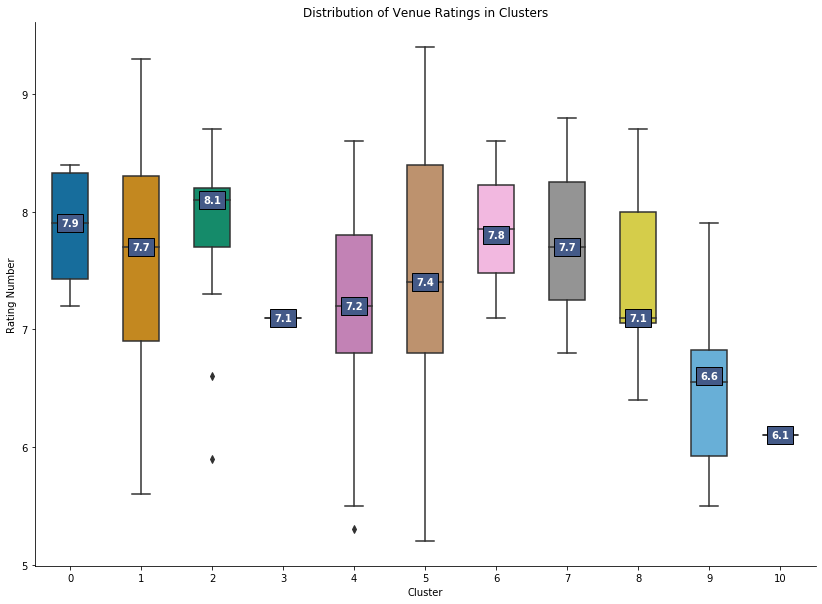

In [49]:
# get distribution summary of venue ratings with boxplot
plt.figure(figsize=(14,10))
plt.title("Distribution of Venue Ratings in Clusters")

ratingsBox = sns.boxplot(y='VenueRating', x='DbCluster', 
             data=cincyCrawlVenues, 
             width=0.5,
             palette="colorblind")

plt.xlabel('Cluster')
plt.ylabel('Rating Number')


ax = ratingsBox.axes
lines = ax.get_lines()
categories = ax.get_xticks()

clusterRatings = []
for cat in categories:
    # every 4th line at the interval of 6 is median  line
    y = round(lines[4+cat*6].get_ydata()[0],1) 
    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=10,
        color='white',
        bbox=dict(facecolor='#445A88'))
    
    clusterRatings.append(y)

plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

#### Likes Distribution

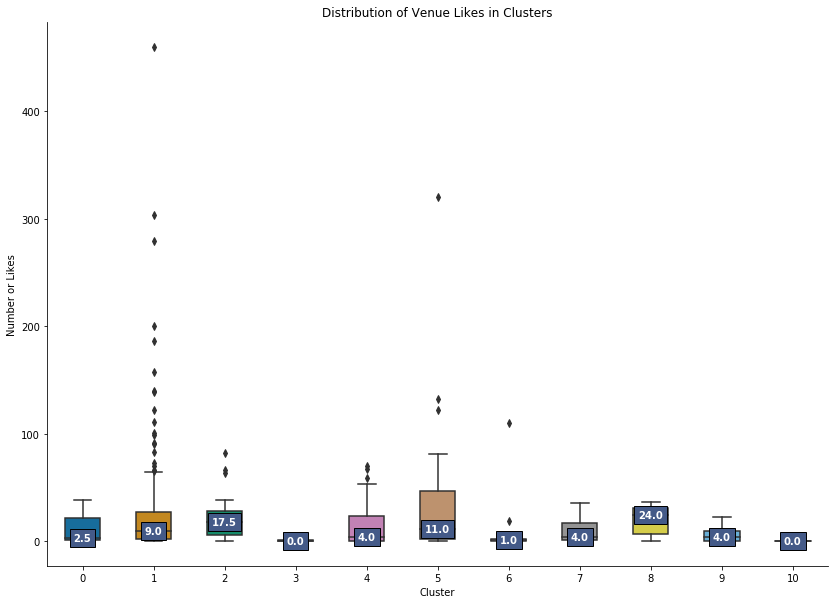

In [50]:
# get distribution summary of Likes with boxplot
plt.figure(figsize=(14,10))
plt.title("Distribution of Venue Likes in Clusters")

ratingsBox = sns.boxplot(y='VenueLikes', x='DbCluster', 
             data=cincyCrawlVenues, 
             width=0.5,
             palette="colorblind")

plt.xlabel('Cluster')
plt.ylabel('Number or Likes')


ax = ratingsBox.axes
lines = ax.get_lines()
categories = ax.get_xticks()

clusterLikes = []
for cat in categories:
    # every 4th line at the interval of 6 is median  line
    y = round(lines[4+cat*6].get_ydata()[0],1) 
    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=10,
        color='white',
        bbox=dict(facecolor='#445A88'))
    
    clusterLikes.append(y)

plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

Too far flung outliers which are probably due to a venue gaming/marketing for likes. Lets drop them in our plot.

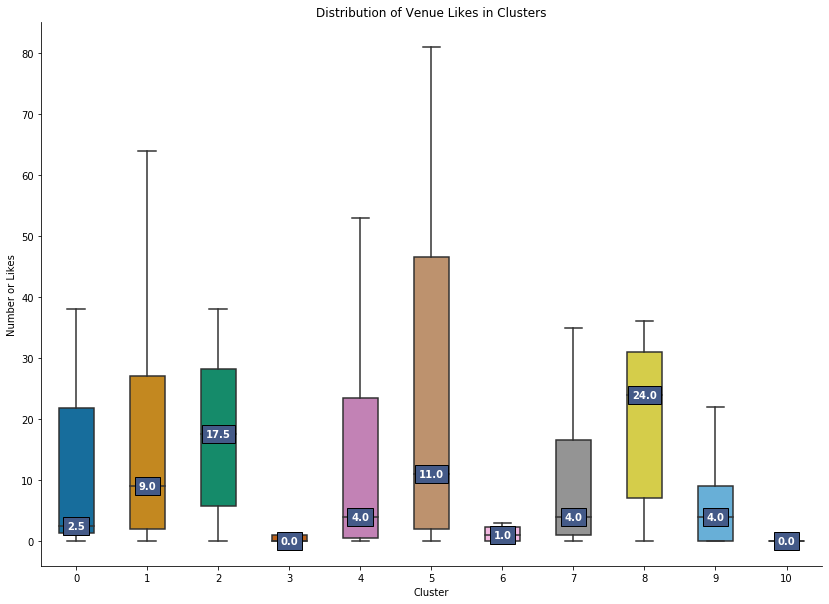

In [51]:
# get distribution summary of Likes with boxplot
plt.figure(figsize=(14,10))
plt.title("Distribution of Venue Likes in Clusters")

ratingsBox = sns.boxplot(y='VenueLikes', x='DbCluster', 
             data=cincyCrawlVenues, 
             width=0.5,
             palette="colorblind",
             showfliers=False)

plt.xlabel('Cluster')
plt.ylabel('Number or Likes')


ax = ratingsBox.axes
lines = ax.get_lines()
categories = ax.get_xticks()

for cat in categories:
    # interval of 5 is median line when outliers are gone
    y = round(lines[4+cat*5].get_ydata()[0],1) 
    ax.text(
        cat, 
        y, 
        f'{y}', 
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=10,
        color='white',
        bbox=dict(facecolor='#445A88'))

plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.show()

From the analysis we see very important information we'll be working with to make recommendations:
- The largest cluster of venues falls into the downtown neighborhoods.
- The ratings medians are similar across all cluster which is hoped for, most venues gets ratings in the 7s (so a C grade). The overall distribution of the ratings does vary

### Recommendation ranking

Is popularity, quality, or variety the most important? This will be determined from the `PRIORITY_ORDER` and `PRIORITY_WEIGHTS` variables.

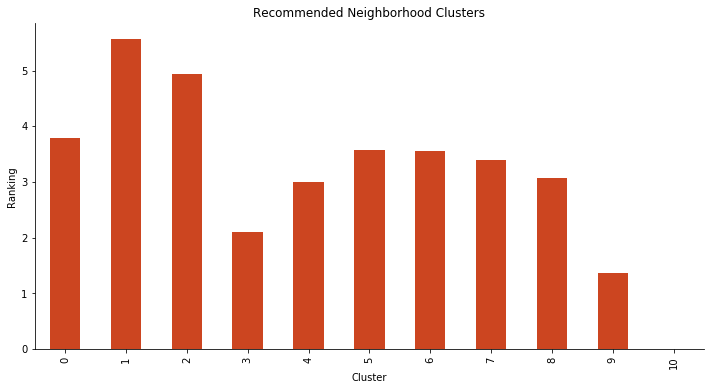

In [52]:
# recommend districts based on ratings, likes, and options
# To weigh the values we'll normalize the counts and medians, then multiply by the weights, and last sum the scores
normalCounts = preprocessing.minmax_scale(clusterCounts)
normalRatings = preprocessing.minmax_scale(clusterRatings)
normalLikes = preprocessing.minmax_scale(clusterLikes)

clusterRanking = []
i = 0
for count in normalCounts:
    clusterRanking.append(count*PRIORITY_ORDER['Count'] + normalRatings[i]*PRIORITY_ORDER['Rating'] + normalLikes[i]*PRIORITY_ORDER['Likes'])
    i = i + 1

plt.figure(figsize=(12,6))
plt.title("Recommended Neighborhood Clusters")
pd.Series(clusterRanking).plot(kind='bar', color='#cc4520')
plt.ylabel('Ranking')
plt.xlabel('Cluster')
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')

plt.show()

## Main Event
#### Crawling Sponsors or Traveling Salesman
The Downtown neighborhoods take the top spot but only slightly over Northside. Last thing to do is dig into the cluster to pick the best matching venues and route.

#### Analyze the Top Neighborhood Cluster

In [53]:
# lets cleanup the dataframe
topCluster = cincyCrawlVenues[cincyCrawlVenues['DbCluster'] == clusterRanking.index(max(clusterRanking))]
# don't need these any longer
topCluster = topCluster.drop(columns=['BusinessDistrict', 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'DbCluster'])
topCluster

,Neighborhood,VenueName,VenueId,VenueLatitude,VenueLongitude,VenueCategory,VenueRating,VenueLikes,VenuePrice
5,Queensgate,City West Brewing Company,580ceb4a38faa26bf32db135,39.108208,-84.525736,Brewery,NaN,1.0,2.0
6,Queensgate,Royal Imports,4f3246f419836c91c7c7cd1e,39.102755,-84.526398,Wine Bar,NaN,0.0,2.0
29,West End,Taft's Ale House,54e8dc93498e2565b4a9f267,39.111378,-84.517476,Brewery,9.3,304.0,2.0
30,West End,Nellie's Tap Room,5584a3b5498e999a9a5dd065,39.111397,-84.517382,Bar,7.6,8.0,2.0
31,West End,Samuel Adams Brewery,4beb4c0aa9900f4720b11740,39.113706,-84.522119,Brewery,5.6,5.0,2.0
...,...,...,...,...,...,...,...,...,...
280,Over-the-Rhine,S'mores Bar,5a4ff52e4186864b034fc53b,39.109600,-84.511600,Coffee Shop,NaN,2.0,1.0
281,Over-the-Rhine,V's Cafe on 7th,56645ce4498e79f3611b7a34,39.103987,-84.511735,Café,NaN,2.0,1.0
283,Pendleton,Starbucks,4d24b61f2ac6f04df3803745,39.103140,-84.505191,Coffee Shop,7.1,1.0,1.0
284,Pendleton,Cafe 1837,5b043a06c9f907002c10fa7f,39.103036,-84.506542,Café,NaN,0.0,1.0


Here's the tricky bit. Given the min number of primary and secondary categories and max number of venues within walking distance what are our options for a crawl.

We'll start by analyzing the distribution of our primary and secondary venues types.

In [54]:
# Differenciate between primary and secondary
primaryCategory = []
for cat in topCluster['VenueCategory']:
    catName = cat.lower()
    if [k for k, s in enumerate(VENUE_PRIME) if s in catName]:
        primaryCategory.append(1)
    else:
        primaryCategory.append(0)

topCluster['PrimaryCategory'] = primaryCategory

# new center from centeroidCord function
latLong = topCluster[['VenueLongitude', 'VenueLatitude']].values.tolist()
clusterMap = makeMap(centeroidCord(latLong, False), 15)

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(2)]

# add venues with cluster colors
for lat, lng, venue, prime in zip(topCluster['VenueLatitude'], topCluster['VenueLongitude'], topCluster['VenueName'], topCluster['PrimaryCategory']):
    label = '{}'.format(clustN)+' {}'.format(venue)
    label = folium.Popup(label, parse_html=True)
    
    c=colors[np.int(prime)]
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='grey',
        fill=True,
        fill_color=c,
        fill_opacity=0.8).add_to(clusterMap)
    
# display map
clusterMap

Given the distribution of bars (primary) and cafes (secondary) we can select about anywhere to perform a crawl.

To find the top crawl for the cluster we're going to iterate of a sorted list of rating and likes and find which grouping of the `MAX_VENUES` is the highest that meets our critier.

In [55]:
# fill in NaN with median values for ratings
print('NaN counts to replace with median: ', topCluster['VenueRating'].isna().sum())
theRatings =  topCluster.dropna(subset=['VenueRating'])
ratingMedian = np.median(theRatings['VenueRating'].tolist())

# top venues based on priorities
topVenues = topCluster
topVenues[['VenueRating']] = topVenues[['VenueRating']].fillna(value=ratingMedian)
topVenues = topVenues.sort_values(['VenueRating', 'VenueLikes'], ascending=[False, False]).reset_index(drop=True)
#topVenues = topVenues.drop(columns=['VenueId'])
topVenues = topVenues[['VenueName', 'Neighborhood', 'VenueLatitude', 'VenueLongitude', 'VenueRating', 'VenueLikes', 'VenuePrice', 'PrimaryCategory']]
topVenues.head(10)

NaN counts to replace with median:  34


,VenueName,Neighborhood,VenueLatitude,VenueLongitude,VenueRating,VenueLikes,VenuePrice,PrimaryCategory
0,Rhinegeist Brewery,Over-the-Rhine,39.117221,-84.520129,9.3,460.0,1.0,1
1,Taft's Ale House,West End,39.111378,-84.517476,9.3,304.0,2.0,1
2,Coffee Emporium,Downtown,39.107498,-84.512390,9.1,279.0,1.0,0
3,Graeter's Ice Cream,Over-the-Rhine,39.110662,-84.515525,9.0,51.0,2.0,0
4,Cheapside Cafe,Downtown,39.105442,-84.507739,8.9,91.0,1.0,0
5,Longfellow,Over-the-Rhine,39.109734,-84.512704,8.9,25.0,2.0,1
6,1215 Wine Bar & Coffee Lab,Over-the-Rhine,39.108851,-84.515014,8.8,101.0,2.0,0
7,Sundry and Vice,Over-the-Rhine,39.109378,-84.515852,8.8,65.0,3.0,1
8,Sleepy Bee Cafe,Downtown,39.100055,-84.512272,8.8,21.0,1.0,0
9,Pins Mechanical Co.,Downtown,39.108548,-84.511507,8.8,13.0,2.0,1


In [56]:
# Take a sample of seven and see if we can group them
venueSet = topVenues
crawlFit = False
maxIndex = 7

# this could be clearner and more effiecient but this should be a short quick run
while not crawlFit:
    # DBSCAN to veryfy it's walkable
    coords = venueSet.iloc[0:maxIndex, 2:4].to_numpy()
    cvDb = DBSCAN(eps=epsilon, min_samples=MIN_VENUES, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
    clusterLabels = cvDb.labels_
    numClusters = len(set(clusterLabels))
    clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
    set(clusterLabels)
    tempSet = venueSet.iloc[0:maxIndex, 0:8]
    tempSet['DbCluster'] = clusterLabels
    tempSet = tempSet[tempSet.DbCluster == 0].reset_index(drop=True)
    
    primeCount = tempSet['PrimaryCategory'].value_counts() 
    if tempSet.shape[0] >= MIN_VENUES and primeCount[1] >= MIN_PRIMES and primeCount[0] >= MIN_SECONDARY:
        crawlFit = True
    else:
        maxIndex = maxIndex + 1
    

# combine the cluster data with cincyVenues
venueSet = tempSet
venueSet

,VenueName,Neighborhood,VenueLatitude,VenueLongitude,VenueRating,VenueLikes,VenuePrice,PrimaryCategory,DbCluster
0,Rhinegeist Brewery,Over-the-Rhine,39.117221,-84.520129,9.3,460.0,1.0,1,0
1,Taft's Ale House,West End,39.111378,-84.517476,9.3,304.0,2.0,1,0
2,Coffee Emporium,Downtown,39.107498,-84.512390,9.1,279.0,1.0,0,0
3,Graeter's Ice Cream,Over-the-Rhine,39.110662,-84.515525,9.0,51.0,2.0,0,0
4,Cheapside Cafe,Downtown,39.105442,-84.507739,8.9,91.0,1.0,0,0
5,Longfellow,Over-the-Rhine,39.109734,-84.512704,8.9,25.0,2.0,1,0
6,1215 Wine Bar & Coffee Lab,Over-the-Rhine,39.108851,-84.515014,8.8,101.0,2.0,0,0


In [57]:
latLong = venueSet[['VenueLongitude', 'VenueLatitude']].values.tolist()
crawlMap = makeMap(centeroidCord(latLong, False), 16)

# add approximate buisness center markers to map
for lat, lng, venue in zip(venueSet['VenueLatitude'], venueSet['VenueLongitude'], venueSet['VenueName']):
    label = '{}'.format(venue)
    label = folium.Popup(label, parse_html=True, show=True, max_width=224)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='black',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(crawlMap)

folium.PolyLine(venueSet[['VenueLatitude', 'VenueLongitude']].values.tolist(), color="green", weight=3.5, opacity=1).add_to(crawlMap)

# display map
crawlMap